# <div style="background-color:lightblue; padding:10px">EXPLORATIVE DATA ANALYSIS (EDA) of AirBnb Prices in New York</div>

Author: Tatjana Chernenko


<div style="background-color:lightblue; padding:10px">Dataset: 

Kaggle, New York City Airbnb Open Data (Airbnb listings and metrics in NYC, NY, USA (2019) )</div>


## Imports

In [359]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import seaborn as sns
from scipy.stats import norm
import plotly
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap

print(tf.__version__)
print("Seaborn version:", sns.__version__)

2.12.0
Seaborn version: 0.13.0


## Load data and take a look at it

In [360]:
data = pd.read_csv('AB_NYC_2019.csv')  # pd.read_csv('AB_NYC_2019.csv').sample(frac=1)  # shaffle the instances
print(data.shape)

(48895, 16)


In [361]:
# information of dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [362]:
# Check the data types of each attribute
data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [363]:
# Check if there are duplicates:
data.duplicated().sum()
# df.drop_duplicates(inplace=True)  # delete if needed

0

In [364]:
# first 5 rows of dataframe
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [365]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


## Null values

In [366]:
# check null values in dataframe

"""
The isnull() function in Pandas is specifically designed to identify and count NULL or 
NaN values within the DataFrame. However, it doesn't directly account for other types of missing or placeholder values, 
such as zeros or empty strings, which might not be recognized as NULL or NaN.
"""
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

We might want to specifically check for these values in the 'price' column to identify and handle them accordingly, as we see that the min price is zero.

In [367]:
# Count zero values in the 'price' column
zero_price_count = (data['price'] == 0).sum()
print("Count of zero values in 'price' column:", zero_price_count)

Count of zero values in 'price' column: 11


!!! For this specific EDA we leave prices = 0 dollars for now (they will be deleted later as extremes during further analysis and cleansing)

<div style="background-color:lightblue; padding:10px">
There are rental listings without last_review and reviews per month, without the name or host_name. 
    Other categories are non-zero, incl. prices.</div>


## Exploratory data analysis

Let's have a look at the hosts:

<Figure size 4000x4000 with 0 Axes>

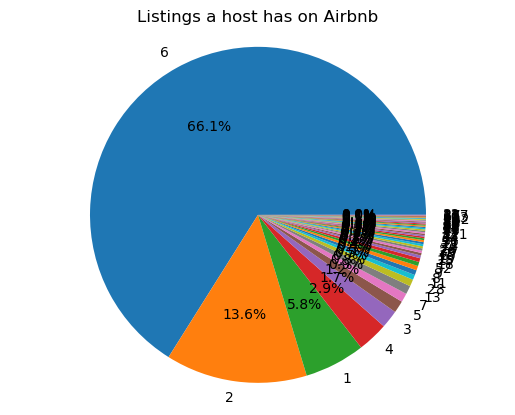

In [368]:
# Visualizing the percentage of listings most host have
labels = data['calculated_host_listings_count'].unique()
sizes = data['calculated_host_listings_count'].value_counts()*100

plt.figure(figsize = (40,40))
fig, ax = plt.subplots()
ax.pie(sizes, labels = labels, autopct = '%1.1f%%')
ax.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
ax.set_title('Listings a host has on Airbnb')


plt.show()

Most of the hosts have 6 rental listings on Arbnb.

### Airbnbs Having most number of Reviews

In [375]:
most_reviews = data.sort_values(by = 'number_of_reviews', ascending = False)
most_reviews.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
11759,9145202,Room near JFK Queen Bed,47621202,Dona,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,2019-07-05,14.58,2,333
2031,903972,Great Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,2019-06-21,7.75,3,293
2030,903947,Beautiful Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,2019-06-23,7.72,3,342
2015,891117,Private Bedroom in Manhattan,4734398,Jj,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,2019-06-15,7.57,3,339
13495,10101135,Room Near JFK Twin Beds,47621202,Dona,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,2019-06-27,13.40,2,173


## Cheapest Airbnbs in New York

In [377]:
cheapest = data.sort_values(by = 'price', ascending = True)
cheapest.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
25796,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,2019-06-23,4.35,6,222
25634,20523843,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,2019-05-18,0.71,5,0
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127
25753,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2017-10-27,0.53,2,0
23161,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,2018-01-06,0.05,4,28


## Most expensive Airbnb in New York

In [379]:
luxury = data.sort_values(by = 'price', ascending = False)
luxury.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
9151,7003697,Furnished room in Astoria apartment,20582832,Kathrine,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,2016-02-13,0.04,1,0
17692,13894339,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Erin,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,2017-07-27,0.16,1,0
29238,22436899,1-BR Lincoln Center,72390391,Jelena,Manhattan,Upper West Side,40.77213,-73.98665,Entire home/apt,10000,30,0,NaN,NaN,1,83
40433,31340283,2br - The Heart of NYC: Manhattans Lower East ...,4382127,Matt,Manhattan,Lower East Side,40.71980,-73.98566,Entire home/apt,9999,30,0,NaN,NaN,1,365
12342,9528920,"Quiet, Clean, Lit @ LES & Chinatown",3906464,Amy,Manhattan,Lower East Side,40.71355,-73.98507,Private room,9999,99,6,2016-01-01,0.14,1,83


### Most Expensive Airbnbs in Brooklyn

### Visualizing the most used words in the names of the most expensive Airbnbs in New York City

/var/folders/y6/60dj6z95209gs2mgjpvchp5w0000gn/T/ipykernel_42465/2617546392.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



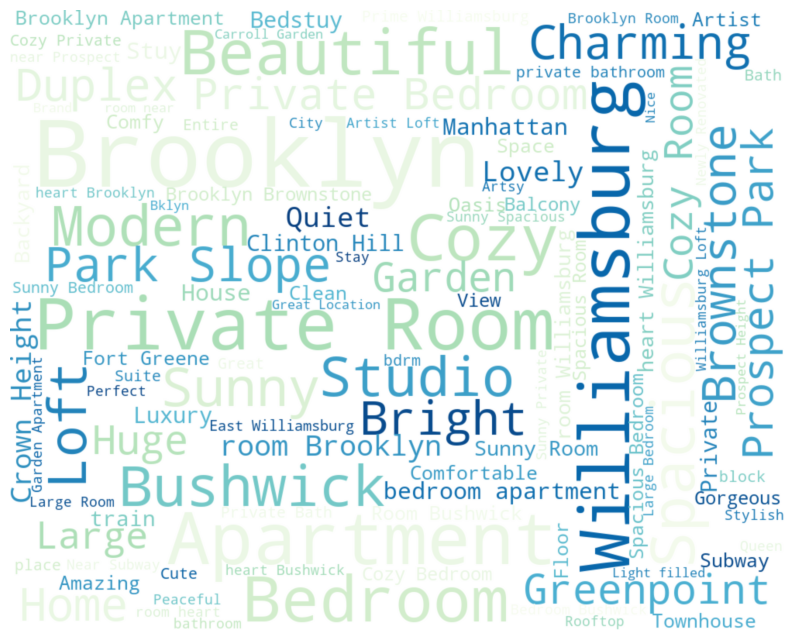

In [372]:
# Visualizing the most used words in the names of the most expensive Airbnbs in Brooklyn
# Convert 'name' column to string explicitly
airbnb_brooklyn['name'] = airbnb_brooklyn['name'].astype(str)

airbnb_brooklyn = data[data['neighbourhood_group'] == 'Brooklyn']
print(airbnb_brooklyn['name'])
             
word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap = 'GnBu', 
                       margin = 0,
                       max_words = 200,  
                       min_word_length = 4,
                       max_font_size = 120, min_font_size = 15,  
                       background_color = "white").generate(" ".join(airbnb_brooklyn['name'].astype(str)))

plt.figure(figsize = (10, 15))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

If the usecase can profit from it, we can visualize wordmaps for other neighbourhood groups as well.

### Visualizing the most used words in the names of the cheapest Airbnbs in New York City

In [371]:
cheapest = data.sort_values(by = 'price', ascending = True)
cheapest.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
25796,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,2019-06-23,4.35,6,222
25634,20523843,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,2019-05-18,0.71,5,0
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127
25753,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2017-10-27,0.53,2,0
23161,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,2018-01-06,0.05,4,28


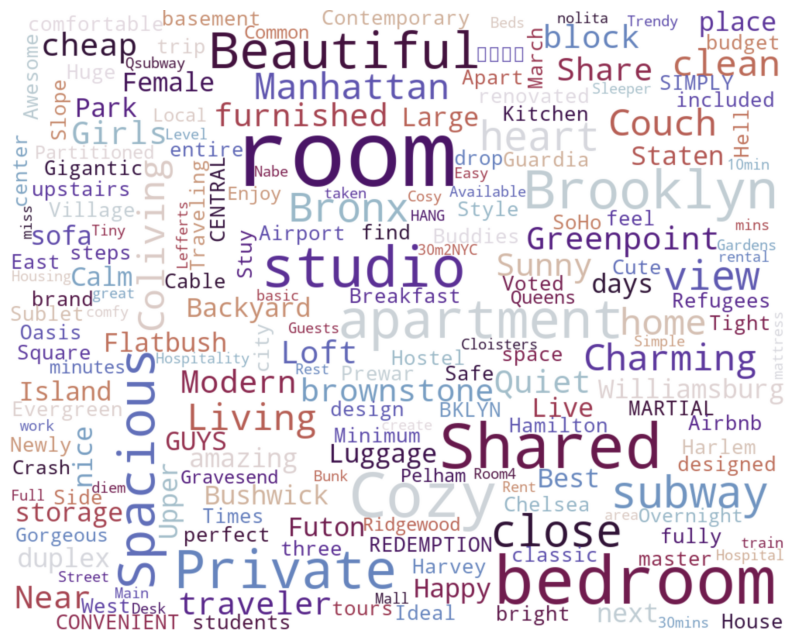

In [373]:
# Storing the names of the 100 cheapest airbnbs in New York in a separate variable

cheapest = cheapest.head(100)

# Visualizing the most used words in the names of the cheapest Airbnbs in New York City
word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap = 'twilight_shifted', 
                       margin = 0,
                       max_words = 200,  
                       min_word_length = 4,
                       max_font_size = 120, min_font_size = 15,  
                       background_color = "white").generate(" ".join(cheapest['name'].astype(str)))

plt.figure(figsize = (10, 15))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

Zero prices may influence the results, we may want to delete them for the plot.

In [263]:
non_zero_prices = data[data['price'] > 0]  # Exclude rows with price = 0
cheapest_non_zero = non_zero_prices.sort_values(by='price', ascending=True)
cheapest_non_zero.head(5)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
24100,19415314,"Girls only, cozy room one block from Times Square",47336995,Mario,Manhattan,Hell's Kitchen,40.75812,-73.98935,Shared room,10,1,2,2017-06-24,0.08,1,0
32810,25839759,Gigantic Sunny Room in Park Slope-Private Back...,167570251,Rachel,Brooklyn,Sunset Park,40.66242,-73.99464,Entire home/apt,10,1,14,2018-10-28,1.06,1,4
33225,26235873,Voted #1 Airbnb In NYC,197169969,Maria,Queens,Jamaica,40.68939,-73.79886,Entire home/apt,10,2,22,2019-07-06,1.76,1,332
31066,24114389,"Very Spacious bedroom, steps from CENTRAL PARK.",180661875,Salim,Manhattan,Upper West Side,40.76844,-73.98333,Private room,10,1,2,2018-04-23,0.13,1,0
35601,28270998,"Charming, bright and brand new Bed-Stuy home",647528,Caterina,Brooklyn,Bedford-Stuyvesant,40.69508,-73.95164,Entire home/apt,10,3,5,2019-07-02,0.51,1,0


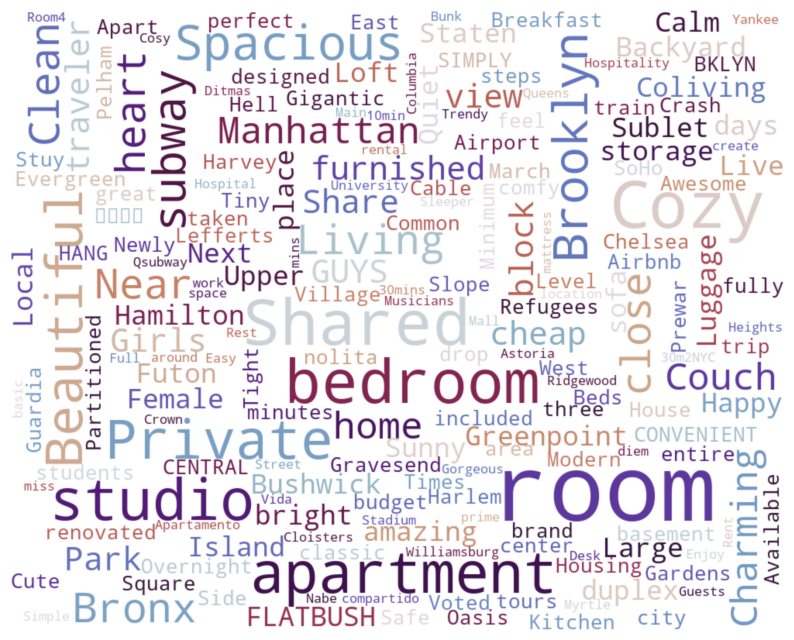

In [264]:
# Storing the names of the 100 cheapest airbnbs in New York in a separate variable

cheapest_non_zero = cheapest_non_zero.head(100)

# Visualizing the most used words in the names of the cheapest Airbnbs in New York City
word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap = 'twilight_shifted', 
                       margin = 0,
                       max_words = 200,  
                       min_word_length = 4,
                       max_font_size = 120, min_font_size = 15,  
                       background_color = "white").generate(" ".join(cheapest_non_zero['name'].astype(str)))

plt.figure(figsize = (10, 15))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

### Visualizing the most used words in the names of the most expensive Airbnbs in New York City

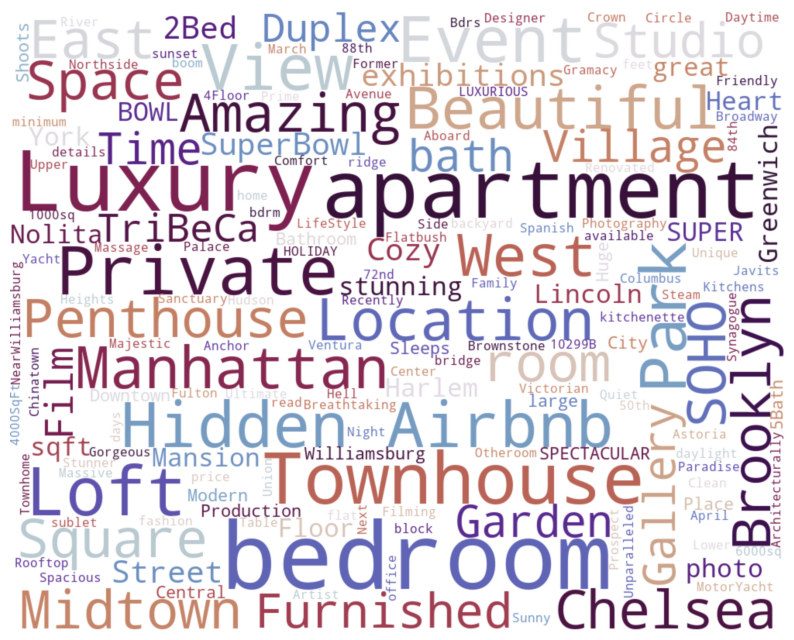

In [381]:
# Storing the names of the 100 luxurious airbnbs in New York in a separate variable
luxury = luxury.head(100)

# Visualizing the most used words in the names of the luxurious Airbnbs in New York City
word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap = 'twilight_shifted', 
                       margin = 0,
                       max_words = 200,  
                       min_word_length = 4,
                       max_font_size = 120, min_font_size = 15,  
                       background_color = "white").generate(" ".join(luxury['name'].astype(str)))

plt.figure(figsize = (10, 15))
plt.imshow(word_cloud, interpolation = "gaussian")
plt.axis("off")
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

The cheapest Airbnbs use words like 'Subway', 'Studio', 'Room', 'Beautiful', 'Cozy', 'Spacious', 'Shared' and 'Cheap' while the expensive Airbnbs use words like 'Penthouse', 'Luxury', 'Location', 'Hidden', 'Park', 'SOHO' and 'View'.

People who choose cheap Airbnbs generally look for properties which are spacious, cosy ambiance, cheap and near to the subway station as it reduces the transport cost and brings down the overall cost of their trip while people who prefer luxurious Airbnbs opt them because of privacy (peaceful and secluded from crowded places), exceptional comfort and a prime location (close to famous landmarks such as 'Central Park').

<div style="background-color:lightblue; padding:10px">
</div>

## Check number of rental listings per neighbourhood_group

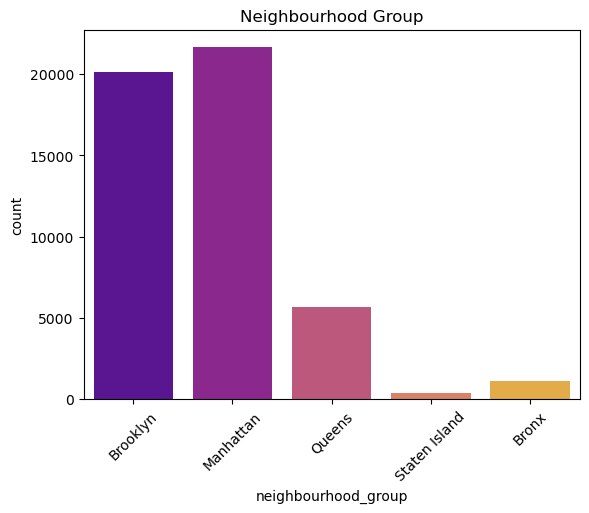

In [267]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert 'neighbourhood_group' to a categorical data type
#data['neighbourhood_group'] = df['neighbourhood_group'].astype('category')

# Create the countplot
sns.countplot(data=data, x='neighbourhood_group', hue="neighbourhood_group", palette='plasma')
plt.title('Neighbourhood Group')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

plt.show()  # Display the plot

<div style="background-color:lightblue; padding:10px">
</div>

The highest number of rental listings are in Manhattan, followed by Brooklyn. The number of listings in Staten Island and Bronx is very low.
This shows either the market situraion, or biased data.
    
<div style="background-color:lightblue; padding:10px">
</div>
    

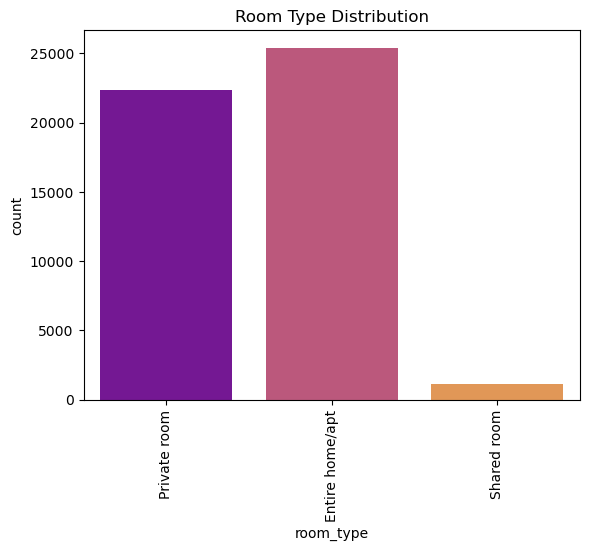

In [268]:
sns.countplot(data=data, x='room_type', hue="room_type", palette='plasma')
plt.title('Room Type Distribution')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

There is a very small amount of shared rooms in the dataset, which may again show the market situration or bias in data.

<div style="background-color:lightblue; padding:10px">
</div>

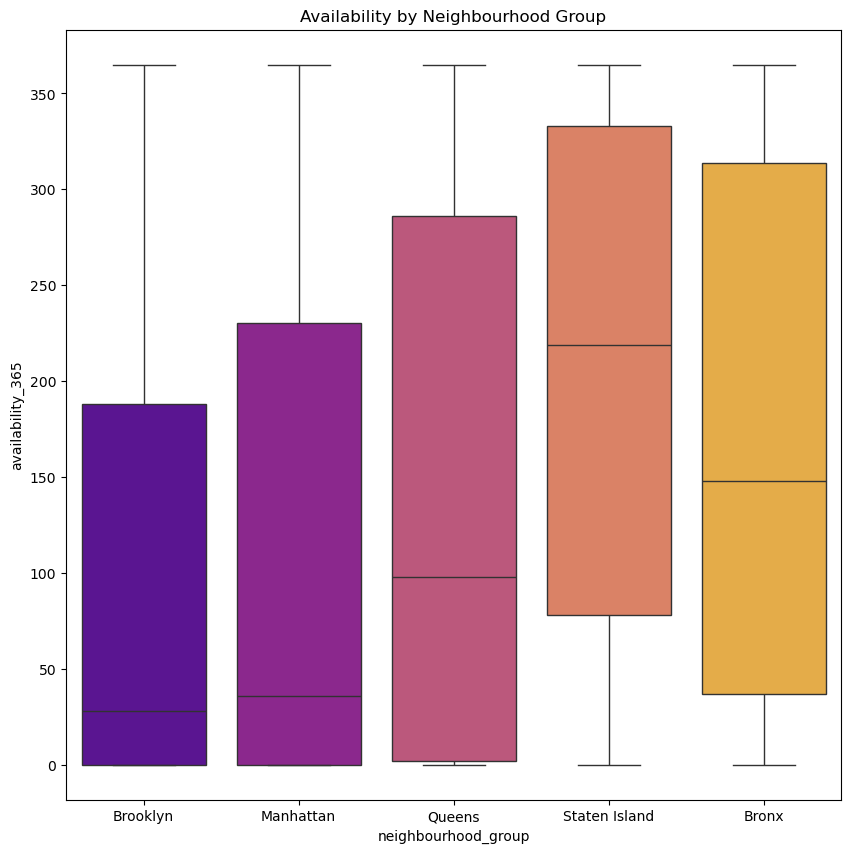

In [269]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=data, x='neighbourhood_group',y='availability_365',hue="neighbourhood_group", palette='plasma')
plt.title('Availability by Neighbourhood Group')
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

The highest availability_365 show the rental listings from Bronx and Staten Island, the lowest - Brooklyn and Manhattan. 

<div style="background-color:lightblue; padding:10px">
</div>

## Geography

### Visualizing the Airbnbs in New York City on the Map

In [270]:
fig = px.scatter_mapbox(data, lat = "latitude", lon = "longitude", hover_name = "neighbourhood", 
                        hover_data = ["neighbourhood_group", "price"],
                        color_discrete_sequence = ["fuchsia"], zoom = 3, height = 300)
fig.update_layout(mapbox_style = "open-street-map")
fig.update_layout(margin = {"r":0,"t":0,"l":0,"b":0})
fig.show()

In [271]:
Long=-73.80
Lat=40.80
locations = list(zip(data.latitude, data.longitude))

map1 = folium.Map(location=[Lat,Long], zoom_start=9)
FastMarkerCluster(data=locations).add_to(map1)
map1

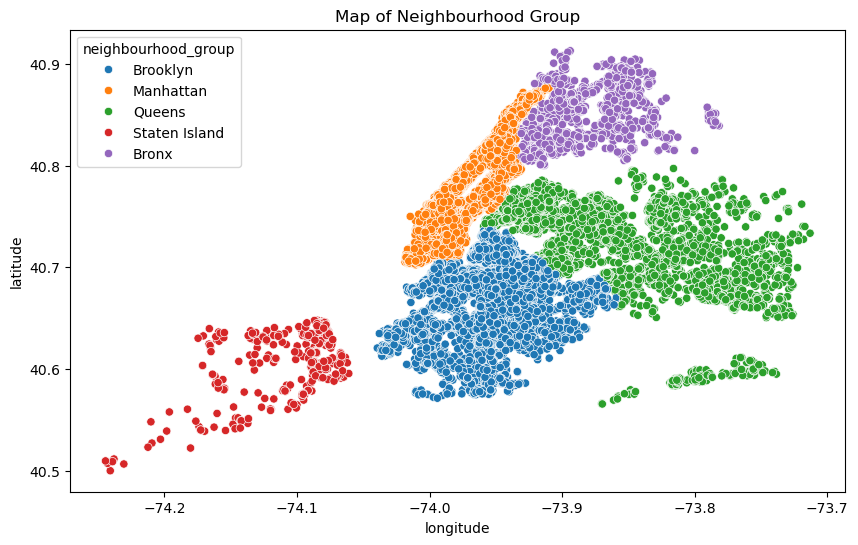

In [272]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='longitude', y='latitude', hue='neighbourhood_group')
plt.title('Map of Neighbourhood Group')
#plt.ioff()  # Disable interactive mode for displaying the plot

plt.show()

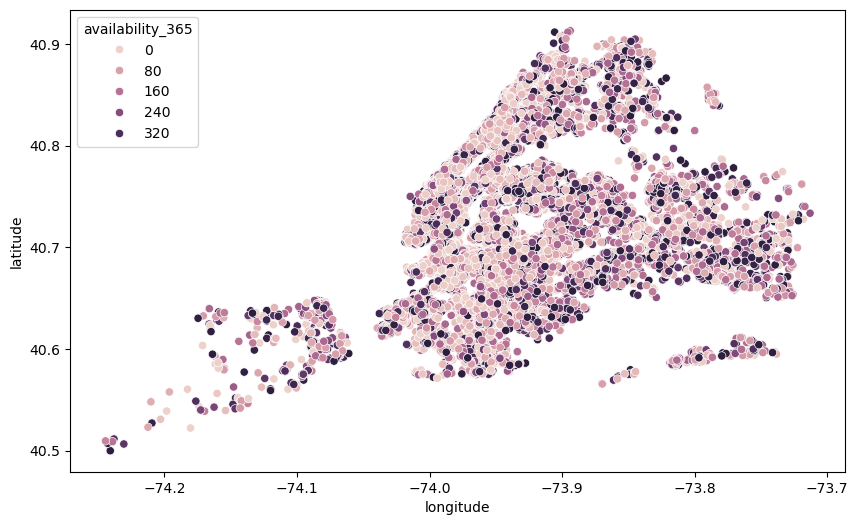

In [273]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=data.longitude, y=data.latitude, hue=data.availability_365)
plt.ioff()

plt.show()

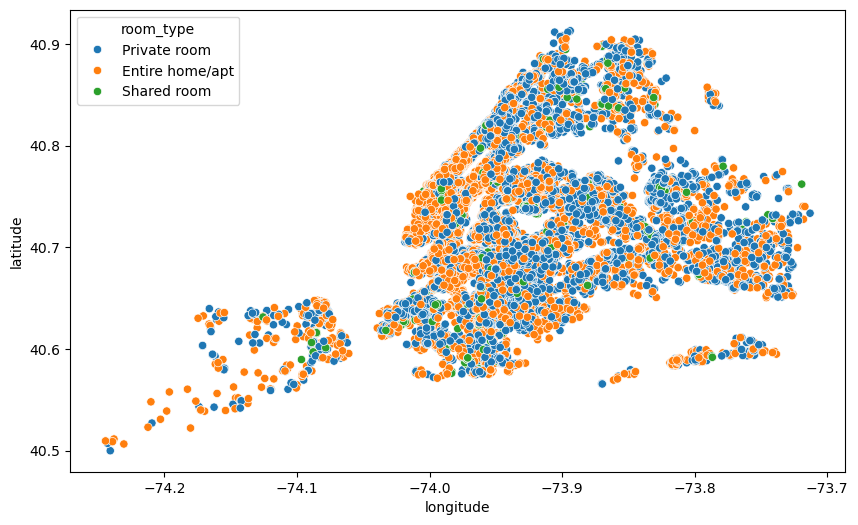

In [274]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='longitude', y='latitude', hue='room_type')
plt.ioff()

plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

We see clear geographical clusters in data: neighbourood groups and latitude+longtitude correlate with neighbourood groups, so we may want to potencially exclude latitude and longtitude from the feature set later.

The rental types are distributed consistently with an exception for Manhattan: it offers more Entire home/apt than other groups. 

<div style="background-color:lightblue; padding:10px">
</div>

## Price

### Price by room type

In [275]:
# Grouping based on room types
private_room = data['room_type'] == 'Private room'
entire_home = data['room_type'] == 'Entire home/apt'
shared_room = data['room_type'] == 'Shared room'

# Calculating the avergae price in each neighbourhood
private_avg = data[private_room]['price'].mean()
entire_avg = data[entire_home]['price'].mean()
shared_avg = data[shared_room]['price'].mean()


print("--- Average Price of the Room Types ---")
print("Private Room:", private_avg)
print("Entire Home/Apt:", entire_avg)
print("Shared room:", shared_avg)

--- Average Price of the Room Types ---
Private Room: 89.78097285675894
Entire Home/Apt: 211.79424613325986
Shared room: 70.12758620689655


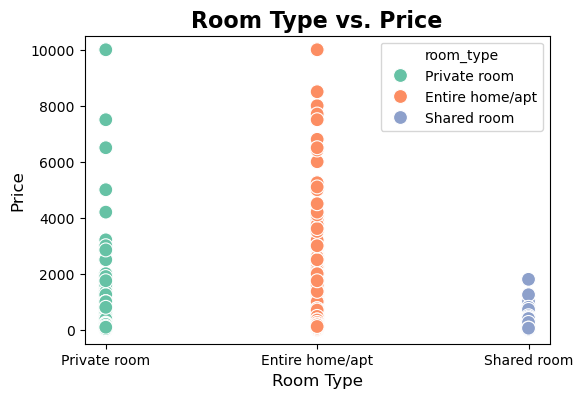

In [276]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='room_type', y='price', data=data, hue='room_type', palette="Set2", s=100)

plt.xlabel('Room Type', size=12)
plt.ylabel('Price', size=12)
plt.title('Room Type vs. Price',size=16, weight='bold')
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>
    
**Observation:**

Shared rooms are always cheaper than 2000 dollars. Highest concentration of prices for Private rooms is mostly between till 2000 dollars as well, though expanding higher till approx. 3800 dollars, with outliers in the same price range as Entre home/
Private rooms and Entire home/apt are normally more expensive than Shared rooms.

*--- Average Price of the Room Types ---*

Private Room: 84.16030041929687

Entire Home/Apt: 189.39726749371604

Shared room: 74.7491601343785


<div style="background-color:lightblue; padding:10px">
</div>

### Price by Neighbourhood Group (Borough)

In [277]:
# Grouping based on neighbourhood
bronx = data['neighbourhood_group'] == 'Bronx'
staten_island = data['neighbourhood_group'] == 'Staten Island'
queens = data['neighbourhood_group'] == 'Queens'
brooklyn = data['neighbourhood_group'] == 'Brooklyn'
manhattan = data['neighbourhood_group'] == 'Manhattan'

# Calculating the avergae price in each neighbourhood
bronx_avg = data[bronx]['price'].mean()
statenisland_avg = data[staten_island]['price'].mean()
queens_avg = data[queens]['price'].mean()
brooklyn_avg = data[brooklyn]['price'].mean()
manhattan_avg = data[manhattan]['price'].mean()


print("--- Average Price in the Neighbourhood Group ---")
print("Bronx:",bronx_avg)
print("Staten Island:",statenisland_avg)
print("Quuens:", queens_avg)
print("Brooklyn:",brooklyn_avg)
print("Manhattan:",manhattan_avg)

--- Average Price in the Neighbourhood Group ---
Bronx: 87.4967919340055
Staten Island: 114.81233243967829
Quuens: 99.51764913519237
Brooklyn: 124.38320732192598
Manhattan: 196.8758136743456


In [278]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='neighbourhood_group', y='price', data=data, hue='neighbourhood_group', palette="Set2", s=100) #  palette="Dark2"

plt.xlabel('Neighbourhood Group', size=13)
plt.ylabel('Price', size=13)
plt.title('Neighbourhood Group vs. Price',size=15, weight='bold')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

plt.tight_layout()  # Adjust layout for better padding and spacing

<div style="background-color:lightblue; padding:10px">
</div>

*--- Average Price in the Neighbourhood Group ---*

Bronx: 87.4967919340055

Staten Island: 114.81233243967829

Quuens: 99.51764913519237

Brooklyn: 124.38320732192598

Manhattan: 196.8758136743456

**Observation:** In average, the higher prices of rooms are in Manhattan and Brooklyn. A lot of lower price rooms in Queens, Staten Island, and Bronx.

<div style="background-color:lightblue; padding:10px">
</div>

### Grouping the prices (could be useful for tourists)

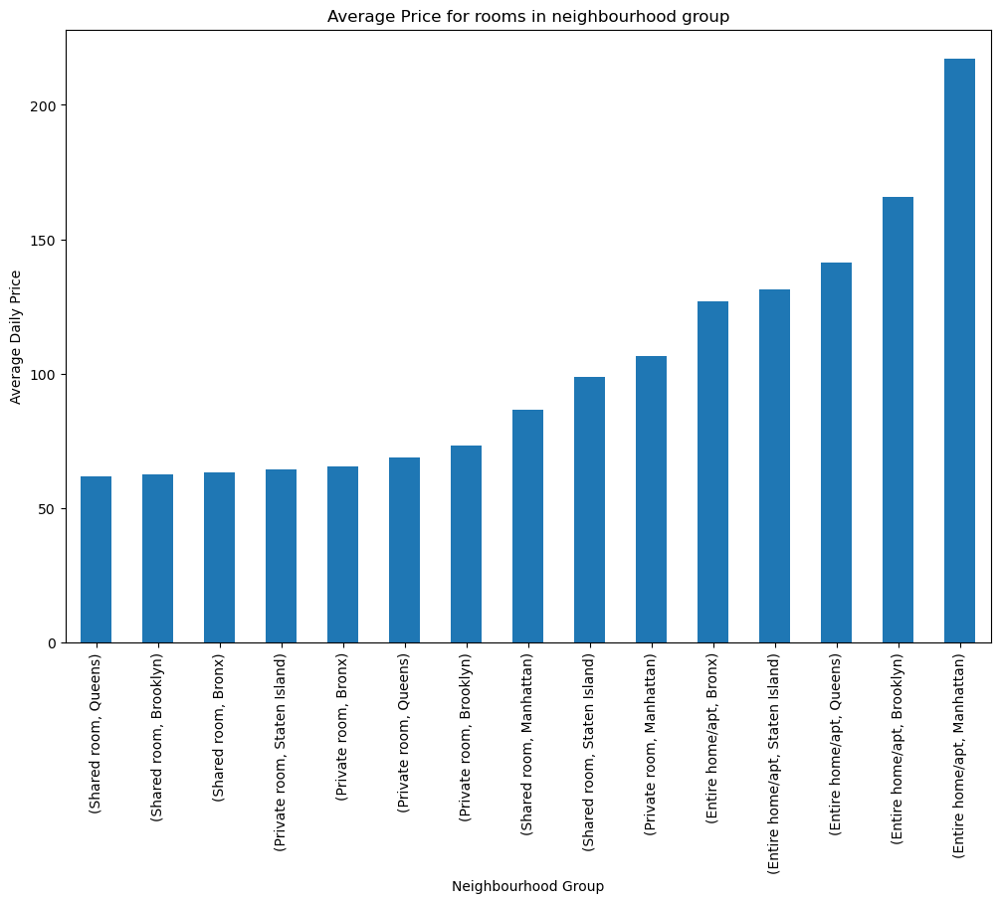

List of Average Price per night based on the neighbourhood group


price
room_type       neighbourhood_group            
Entire home/apt Bronx                126.792916
                Staten Island        131.269006
                Queens               141.328979
                Brooklyn             165.857890
                Manhattan            217.183222
Private room    Staten Island         64.457627
                Bronx                 65.560855
                Queens                68.831240
                Brooklyn              73.023771
                Manhattan            106.502881
Shared room     Queens                61.777778
                Brooklyn              62.366906
                Bronx                 63.294118
                Manhattan             86.656319
                Staten Island         98.750000

In [353]:
data.head()
plt.figure(figsize=(12,8))
df = data[data['minimum_nights']==1]
df1 = data.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
df1.plot(kind='bar')
plt.title('Average Price for rooms in neighbourhood group')
plt.ylabel('Average Daily Price')
plt.xlabel('Neighbourhood Group')
plt.show()
print('List of Average Price per night based on the neighbourhood group')
pd.DataFrame(df1).sort_values(by='room_type')

### Plot the most cheapest and most expensive neighbourhoods

In [382]:
data['neighbourhood'] = data['neighbourhood'].astype(str)
print(data['neighbourhood'].dtype)
#unique_neighbourhood_values = data['neighbourhood'].unique()
#print(unique_neighbourhood_values)

object


### Most expensive:

Top 20 most expensive locality in Airbnb listing are:


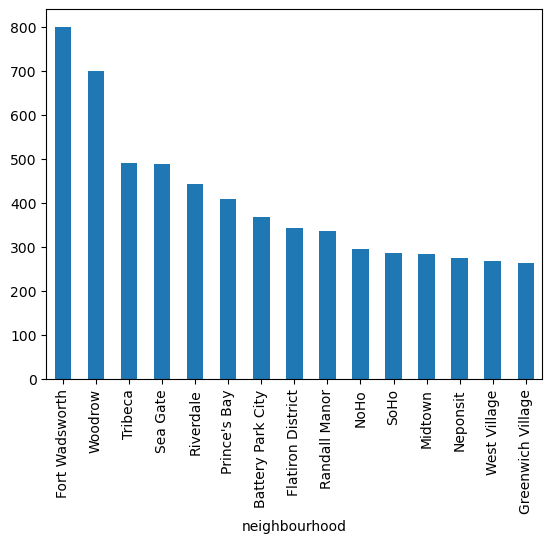

,price
neighbourhood,
Fort Wadsworth,800.000000
Woodrow,700.000000
Tribeca,490.638418
Sea Gate,487.857143
Riverdale,442.090909
Prince's Bay,409.500000
Battery Park City,367.557143
Flatiron District,341.925000
Randall Manor,336.000000


In [383]:
print('Top 20 most expensive locality in Airbnb listing are:')

#df4 = data.dropna(subset=["price"]).groupby("neighbourhood")[["neighbourhood", "price"]].agg("mean").sort_values(by="price",
#                 ascending=False).rename(index=str, columns={"price": "Average price per night based on neighbourhood"}).head(15)

df4 = data.groupby("neighbourhood")["price"].mean().sort_values(ascending=False).head(15)

df4.plot(kind='bar')
plt.show()
pd.DataFrame(df4)

### The cheapest in New York:

Least expensive neighbourhood according to Airbnb listing are


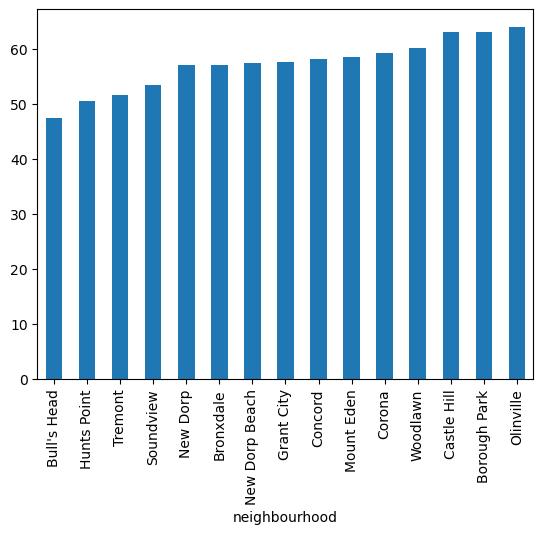

,price
neighbourhood,
Fort Wadsworth,800.000000
Woodrow,700.000000
Tribeca,490.638418
Sea Gate,487.857143
Riverdale,442.090909
Prince's Bay,409.500000
Battery Park City,367.557143
Flatiron District,341.925000
Randall Manor,336.000000


In [388]:
print('Least expensive neighbourhood according to Airbnb listing are')
#df5 = data.dropna(subset=["price"]).groupby("neighbourhood")[["neighbourhood", "price"]].agg("mean").sort_values(by="price",
#                    ascending=False).rename(index=str, columns={"price": "Average price per night based on neighbourhood"}).tail(15)

df5 = data.groupby("neighbourhood")["price"].mean().sort_values(ascending=True).head(15)


df5.plot(kind='bar')
plt.show()
pd.DataFrame(df4)

### Price by number of reviews

In [279]:
plt.figure(figsize=(8,6))
sns.lineplot(data=data, x='price', y='number_of_reviews')

plt.xlabel("Price", size=13)
plt.ylabel("Number of Reviews", size=13)
plt.title("Price vs. Number of Reviews",size=15, weight='bold')

#plt.tight_layout()  # Adjust layout for better padding and spacing

Text(0.5, 1.0, 'Price vs. Number of Reviews')

<div style="background-color:lightblue; padding:10px">
</div>

**Observation:** 

- This line plot demonstrates that lower price listings have a higher number of reviews compared to the low number of reviews for higher price listings.
  
- To go into detail, higher price rooms are unlikely to be rented; therefore, having low to no reviews. The lower cost of the Airbnb plays a big role in terms of getting a number of reviews.

<div style="background-color:lightblue; padding:10px">
</div>

### Location and Review Score

Important criteria; consider only those who have a review more than 50, so that we can have an insight of the data.

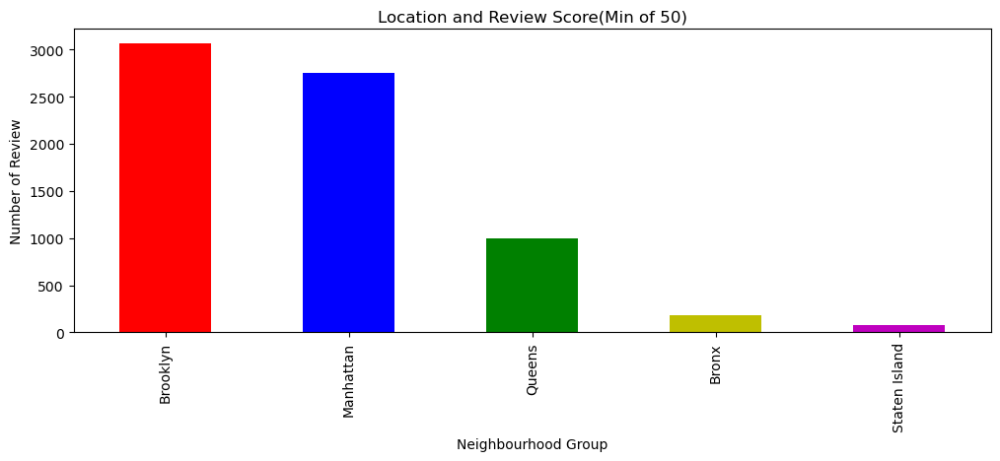

 Count of Review v/s neighbourhood group


,count
neighbourhood_group,
Brooklyn,3065
Manhattan,2751
Queens,997
Bronx,187
Staten Island,81


In [390]:
fig = plt.figure(figsize=(12,4))
review_50 = data[data['number_of_reviews']>=50]
df2 = review_50['neighbourhood_group'].value_counts()
df2.plot(kind='bar',color=['r','b','g','y','m'])
plt.title('Location and Review Score(Min of 50)')
plt.ylabel('Number of Review')
plt.xlabel('Neighbourhood Group')
plt.show()
print(' Count of Review v/s neighbourhood group')
pd.DataFrame(df2)

Brooklyn got most review in comparison to Manhattan (unteresting)). Staten Island which is cheaper has less review than the other neighbourhood group.

### TOP 5 hosts

In [391]:
map1 = folium.Map([40.7128,-74.0080],zoom_start=9.8)
location = ['latitude','longitude']
df = review_50[location]
HeatMap(df.dropna(),radius=8,gradient={.4: 'blue', .65: 'lime', 1: 'red'}).add_to(map1)
map1

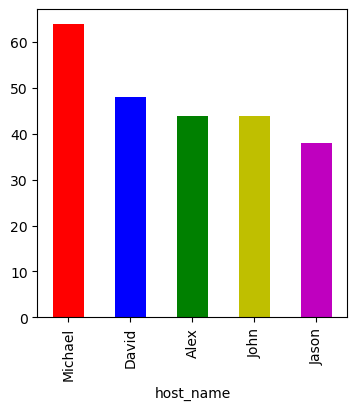

In [397]:
plt.figure(figsize=(4,4))
review_50.head(2)
df1 = review_50['host_name'].value_counts()[:5].plot(kind='bar',color=['r','b','g','y','m'])
plt.show()
#sns.barplot(x=df1.index,y=df1.values)

## NUMERICAL DATA ANALYZING AND CLEANING

In [280]:
price_stats = data['price'].describe()
price_stats

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

<div style="background-color:lightblue; padding:10px">
</div>

- There are a total of 48896 Airbnb listings in the dataset. 
From those listings:

- The mean price is $152.73.
  
- There exists no cost (zero price) rental listings.
  
- The highest daily rental price is $10000. As we see on the visualizations, these listings are outliers.

<div style="background-color:lightblue; padding:10px">
</div>

In [281]:
plt.figure(figsize=(6,6))
sns.distplot(data['price'], fit=norm)  # deprecated
#sns.histplot(data['price'], kde=True, stat='density', linewidth=0)
#sns.kdeplot(data['price'], color='red', linewidth=2)  # KDE plot in red

plt.title("Price Distribution Plot",size=15, weight='bold')
plt.tight_layout()  # Adjust layout for better padding and spacing

/var/folders/y6/60dj6z95209gs2mgjpvchp5w0000gn/T/ipykernel_42465/3855793388.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




In [282]:
# another plot:
data['price_log'] = np.log(data.price+1)

In [283]:
plt.figure(figsize=(12,10))
sns.distplot(data['price_log'], fit=norm)
plt.title("Log-Price Distribution Plot",size=15, weight='bold')
plt.tight_layout()  # Adjust layout for better padding and spacing

/var/folders/y6/60dj6z95209gs2mgjpvchp5w0000gn/T/ipykernel_42465/2447257860.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




With the help of log transformation, the price feature has normal distribution.

In [284]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327,4.736885
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289,0.695344
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000,4.248495
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000,4.672829
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000,5.170484
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000,9.210440


In [285]:
sns.rugplot(data=data, x='price', height=1)

<Axes: title={'center': 'Log-Price Distribution Plot'}, xlabel='price_log', ylabel='Density'>

## Identify and filter out extreme values

(optional; outliers still could be unfiltered; in this case we would apply specific ML approaches).

In [286]:
"""
p1 and p2 represent the 99th and 1st percentiles of the 'price' column in the DataFrame. 
This means p1 is the value below which 99% of prices fall, and p2 is the value below which 1% of prices fall.
These quantiles can be useful to identify extreme values or outliers in the 'price' column.
"""

p1 = data['price'].quantile(0.99)
p2 = data['price'].quantile(0.01)
print(p1, p2)
print(data.shape)


799.0 30.0
(48895, 17)


<div style="background-color:lightblue; padding:10px">
</div>

**Observation:**
- 99% of prices are below 799 dollars,
- 1% of prices fall below 30 dollars.

<div style="background-color:lightblue; padding:10px">
</div>

### Filter out "price" outliers:

In [287]:
"""
This line filters the DataFrame to keep only the rows where the 'price' 
column values are between p1 and p2. This filtering removes extreme outliers from the 'price' column.
"""
print(data.shape)
data = data[(data['price']<p1) & (data['price']>p2)]
print(data.shape)


(48895, 17)
(47744, 17)


In [288]:
"""
Creates a rug plot for the 'minimum_nights' column in the filtered DataFrame, showing the distribution of 'minimum_nights' 
values along the x-axis. The height parameter sets the height of the ticks representing the data points.
"""
plt.figure(figsize=(8,6))
plt.title("Distribution of min nights",size=15, weight='bold')
sns.rugplot(data=data, x='minimum_nights', height=1)


<Axes: title={'center': 'Distribution of min nights'}, xlabel='minimum_nights'>

In [289]:
"""
Calculates the 99th percentile of the 'minimum_nights' column in the filtered DataFrame. 
m1 is the value below which 99% of 'minimum_nights' fall.
"""
m1 = data['minimum_nights'].quantile(0.99)
print(m1)


40.0


<div style="background-color:lightblue; padding:10px">
</div>

**Observation:** 99% of minimum_nights fall below 40 nights.

<div style="background-color:lightblue; padding:10px">
</div>

### Filter out "minimum_nights" outliers:

In [290]:
"""
Filters the DataFrame to retain only the rows where the 'minimum_nights' column values are less than m1, 
essentially removing extreme values from 'minimum_nights'.
"""
data = data[(data['minimum_nights']<m1)]


In [291]:
data['reviews_per_month']


0        0.21
1        0.38
2         NaN
3        4.64
4        0.10
         ... 
48890     NaN
48891     NaN
48892     NaN
48893     NaN
48894     NaN
Name: reviews_per_month, Length: 47262, dtype: float64

In [292]:
# check null values in dataframe
data.isnull().sum()

id                                   0
name                                15
host_id                              0
host_name                           20
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       9465
reviews_per_month                 9465
calculated_host_listings_count       0
availability_365                     0
price_log                            0
dtype: int64

In [293]:
# Check the 'reviews_per_month' column for values equal to '0' and changes them to categorical labels 'no' and 'yes' for non-zero values.

data['reviews_per_month'] = data['reviews_per_month'].apply(lambda s: 'no' if s == '0' else 'yes')


<div style="background-color:lightblue; padding:10px">
</div>

**Observation:** Filtering out data with extreme minimum nights, we also got rid of null values in reviews_per_month, which probably shows the tendency not to leave reviews for very short rentals.

<div style="background-color:lightblue; padding:10px">
</div>

In [294]:
"""
Counts the occurrences of different values in the 'reviews_per_month' column (after the transformation). 
It shows the count of 'no' and 'yes' values in this column.
"""
data['reviews_per_month'].value_counts()


reviews_per_month
yes    47262
Name: count, dtype: int64

In [295]:
"""
Creates a new column 'is_zero' based on the 'availability_365' column. 
It categorizes rows as 'zero' if 'availability_365' is 0 and 'nonzero' otherwise.
"""
data['is_zero'] = data['availability_365'].apply(lambda s: 'zero' if s == 0 else 'nonzero')


In [296]:
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price_log,is_zero
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,yes,6,365,5.010635,nonzero
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,yes,2,355,5.420535,nonzero
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,yes,1,365,5.017280,nonzero
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,yes,1,194,4.499810,nonzero
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,yes,1,0,4.394449,zero


### CATEGORICAL DATA ANALYZING AND CLEANING

In [297]:
data.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'price_log', 'is_zero'],
      dtype='object')

In [298]:
# Count how many times each neighborhood appears in the dataset.
data['neighbourhood'].value_counts()

neighbourhood
Williamsburg          3855
Bedford-Stuyvesant    3602
Harlem                2597
Bushwick              2380
Hell's Kitchen        1916
                      ... 
Richmondtown             1
Woodrow                  1
New Dorp                 1
Rossville                1
Willowbrook              1
Name: count, Length: 220, dtype: int64

In [299]:
nb = data['neighbourhood'].value_counts()

In [300]:
# Plot the count of occurrences for each neighborhood against its index:
plt.figure(figsize=(8,6))

plt.xlabel("Number of occurences", size=13)
plt.ylabel("Neighbourhood index", size=13)
plt.title("Count of occurrences for each neighborhood against its index",size=15, weight='bold')

plt.plot(range(len(nb)), nb)

<div style="background-color:lightblue; padding:10px">
</div>

**Observation**: We may want to simplify or generalize the data for analysis, as there are many neighborhoods with low occurrences and we want to focus on the most common ones. Let's do it.

<div style="background-color:lightblue; padding:10px">
</div>

In [301]:
"""
Checks if the string representation of the value (str(s)) exists within the top 25 neighborhoods (nb[:25]). 
If no, it assigns the value 'others' to that row in the 'neighbourhood' column.
Essentially, this code groups less frequent neighborhoods (beyond the top 25) into a single category labeled 'others'.
"""
data['neighbourhood'] = data['neighbourhood'].apply(lambda s: s if str(s) in nb[:25] else 'others')


In [302]:
# Old variant of data:
nb

neighbourhood
Williamsburg          3855
Bedford-Stuyvesant    3602
Harlem                2597
Bushwick              2380
Hell's Kitchen        1916
                      ... 
Richmondtown             1
Woodrow                  1
New Dorp                 1
Rossville                1
Willowbrook              1
Name: count, Length: 220, dtype: int64

In [303]:
# Now we have less values of neighbourhood feature (26 instead of 220), while outliers are grouped to "others":

data['neighbourhood'].value_counts()


neighbourhood
others                       13481
Williamsburg                  3855
Bedford-Stuyvesant            3602
Harlem                        2597
Bushwick                      2380
Hell's Kitchen                1916
Upper West Side               1900
East Village                  1815
Upper East Side               1755
Crown Heights                 1512
Midtown                       1473
Greenpoint                    1102
East Harlem                   1097
Chelsea                       1055
Lower East Side                894
Astoria                        877
Washington Heights             863
Financial District             729
West Village                   723
Flatbush                       590
Clinton Hill                   561
Long Island City               528
Prospect-Lefferts Gardens      516
Park Slope                     487
Fort Greene                    480
East Flatbush                  474
Name: count, dtype: int64

In [304]:
# Checking neighbourhood group category:
data['neighbourhood_group'].value_counts()

neighbourhood_group
Manhattan        20955
Brooklyn         19488
Queens            5458
Bronx             1009
Staten Island      352
Name: count, dtype: int64

**->** Not too many categories, do not clean.

In [305]:
# Checking room_type group category:
data['room_type'].value_counts()

room_type
Entire home/apt    24666
Private room       21703
Shared room          893
Name: count, dtype: int64

-> Not too many categories, do not clean.

## NUMERICAL DATA VISUALIZATION

## Heatmap for numerical features

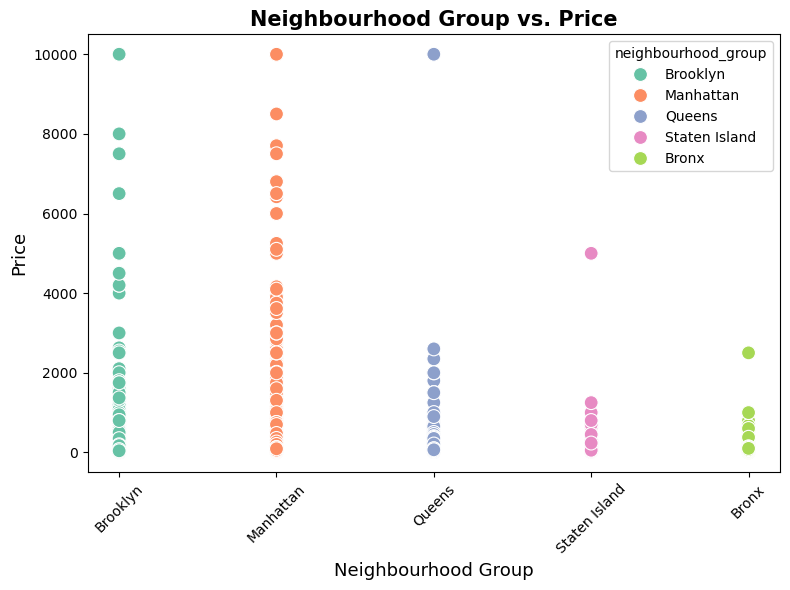

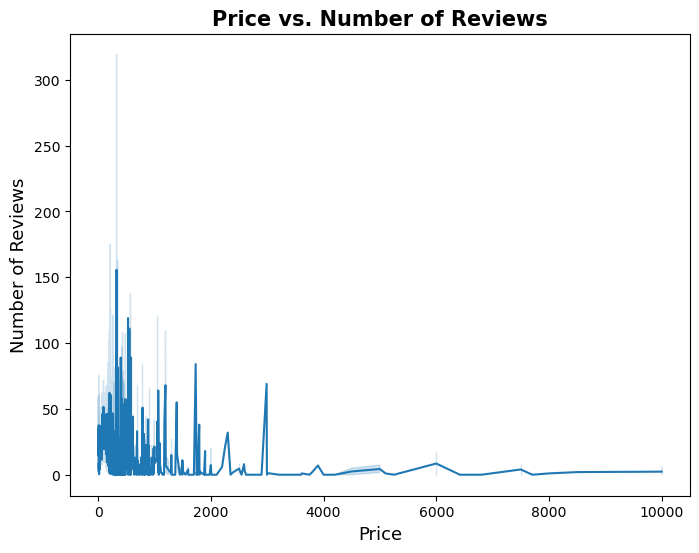

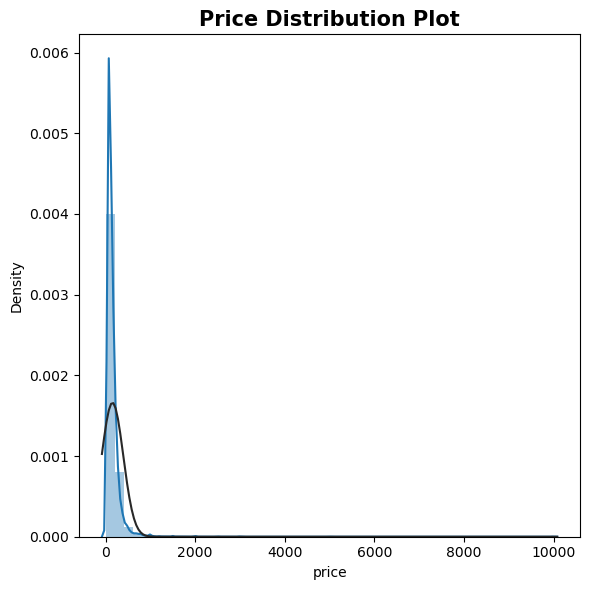

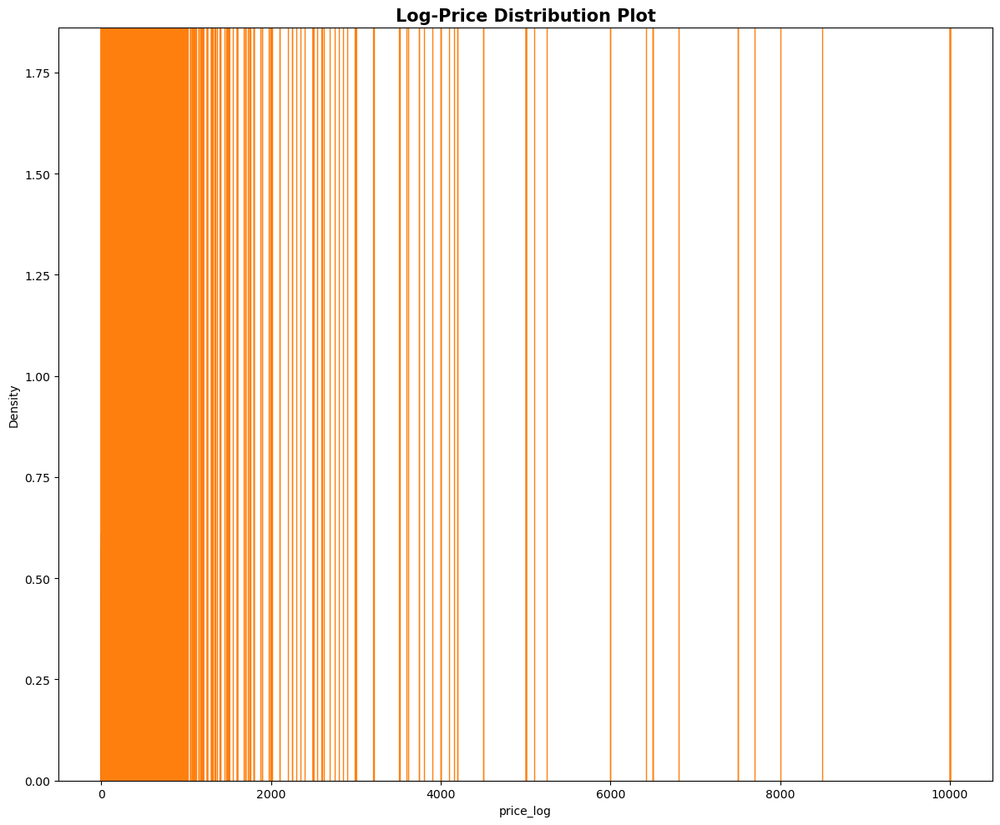

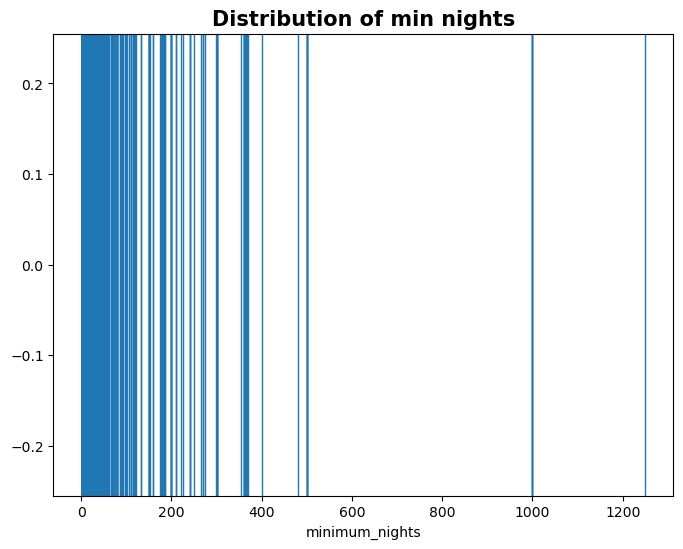

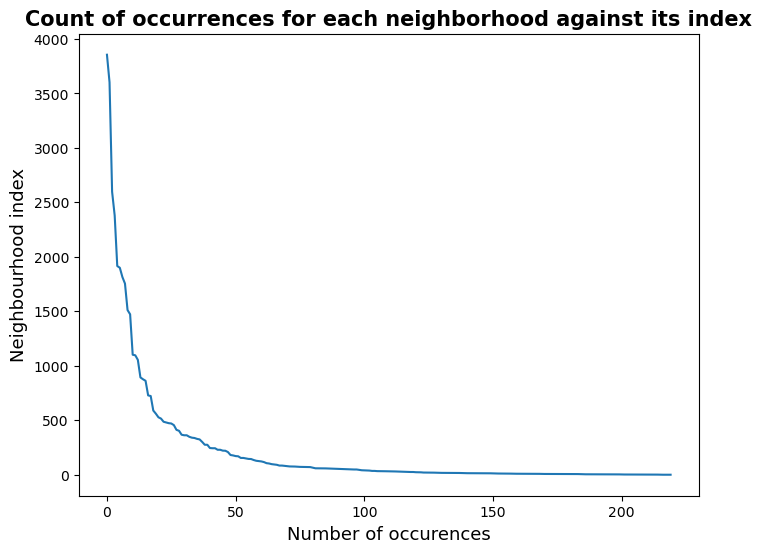

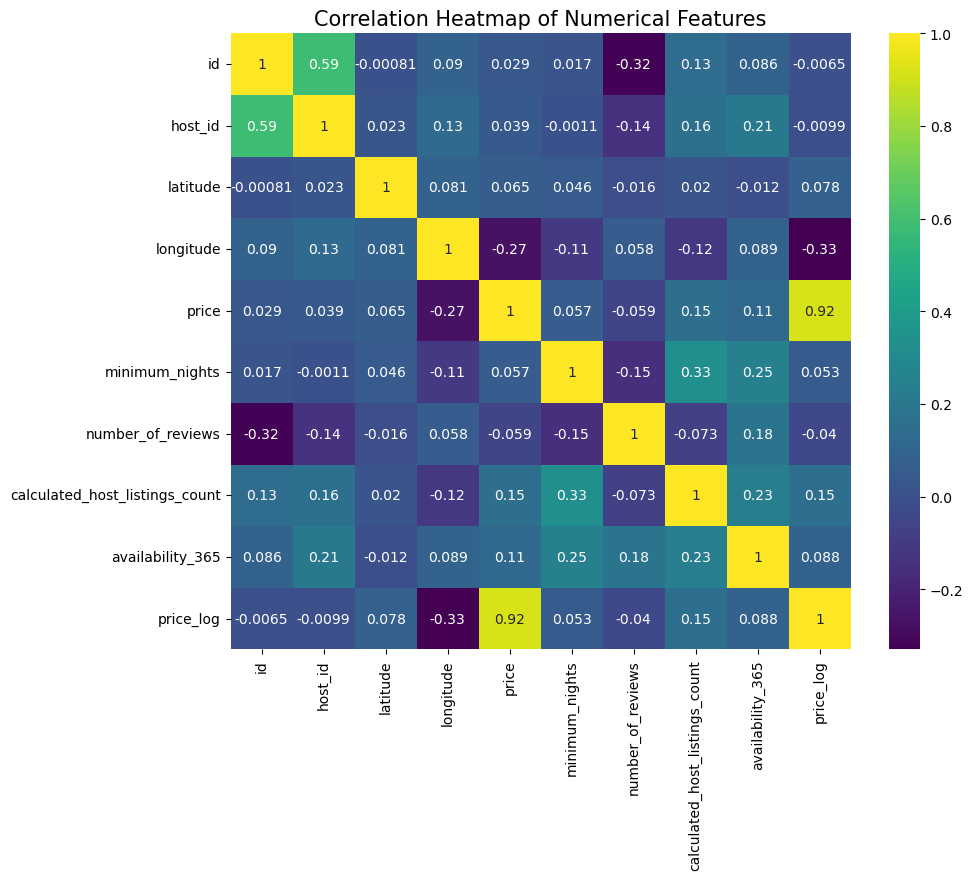

In [306]:
# Selecting numerical features only
numeric_df = data.select_dtypes(include=['float64', 'int64'])  # Selecting only numeric columns

plt.figure(figsize=(10, 8))

# Plotting the correlation heatmap for the numeric columns
sns.heatmap(data=numeric_df.corr(), annot=True, cmap='viridis')
plt.title('Correlation Heatmap of Numerical Features', fontsize=15)
plt.show()


<div style="background-color:lightblue; padding:10px">
</div>

**Observation:** dataset it difficult, no strong correlations.

<div style="background-color:lightblue; padding:10px">
</div>

### Explore correlations and patterns between "price" and "minimum nights":

In [307]:
# Combine a scatter plot between two variables along with histograms for each variable along the axes.

sns.jointplot(data=data,x='price', y='minimum_nights', alpha=0.1)  # alpha=0.1: This parameter controls the transparency of the points in the scatter plot. Here, alpha=0.1 sets the transparency to a low value, making the individual data points more transparent (helpful when dealing with high-density regions to visualize overlapping points).



<div style="background-color:lightblue; padding:10px">
</div>

Displayed is the relationship between 'price' and 'minimum_nights'. Along the center, it has a scatter plot showing the relationship between these two variables. Additionally, it includes histograms on the top and right sides, displaying the distributions of 'price' and 'minimum_nights' separately.

**Observations:** 

- *Densely Packed Range for 'minimum_nights' (y-axis) from 0 to about 7 for prices till about 400:*
This observation suggests that there's a concentration of data points for listings with a low 'minimum_nights' requirement, **possibly indicating that a significant portion of properties in the dataset offer short-term stays or require a minimum of fewer nights for booking for lower prices.**

- *Dense Line at 'minimum_nights' = 10/15/20 and 30, 'price' from 0 to about 400 (x-axis):*
This specific line suggests a cluster of listings that require a longer stay of 30 nights, where the prices predominantly fall within a range of 0 to 400 dollars. It could represent **properties offering monthly rentals or having specific pricing policies for longer stays.**

- The histograms, representing the distribution of 'price' and 'minimum_nights', essentially confirm that there is indeed a concentration of listings with lower prices (up to 400-500 dollars) and shorter minimum nights (up to 7 nights) and 1-month stays.

- Scatter Plot Patterns: We observe a light falling slop (light negative correlation) on the scatterplot: with > minimum_nights, the price gets lower, which **confirms specific pricing policies for longer stays**.

<div style="background-color:lightblue; padding:10px">
</div>


### Check the correlation between price and minimum_nights:

**(We have done it already on the heatmap above; just showing another way to calculate it)**

In [308]:
correlation_coefficient = data['price'].corr(data['minimum_nights'])
print(f"The correlation coefficient between 'price' and 'minimum_nights' is: {correlation_coefficient}")

The correlation coefficient between 'price' and 'minimum_nights' is: 0.05704982595571387


<div style="background-color:lightblue; padding:10px">
</div>

**Interpretation:**
- A value close to 1 implies a strong positive linear relationship (as 'price' increases, 'minimum_nights' tends to increase).
- A value close to -1 indicates a strong negative linear relationship (as 'price' increases, 'minimum_nights' tends to decrease).
- A value close to 0 suggests a weak or no linear relationship between the variables.
  
**--> In our case, the linear relationship between price and meanimum_nights is weak.**
Changes in one variable (price) are not indicative of systematic changes in the other variable (minimum_nights).
In the context of our scatter plot and analysis, this low correlation supports the observation that there's no strong linear trend between 'price' and 'minimum_nights'. **Even though there might be clusters or concentrations in certain areas, they don't follow a consistent linear pattern.** 

! Though, a low correlation coefficient doesn't necessarily imply no relationship. It's possible that other factors or non-linear relationships could influence the interaction between 'price' and 'minimum_nights' in our dataset.

<div style="background-color:lightblue; padding:10px">
</div>

## Explore correlations and patterns between "price" and "number_of_reviews nights":

In [309]:
sns.jointplot(data=data,x='price', y='number_of_reviews', alpha=0.1)

<div style="background-color:lightblue; padding:10px">
</div>

**Observations:**

- Densely Packed Range for 'number_of_reviews' (y-axis) from 0 to about 300 for prices till about 400: This observation suggests that there's a concentration of data points for listings with a low 'prices' requirement and that rentals with higher prices have less reviews (probably less used).

- The histograms, representing the distribution of 'price' and 'minimum_nights', essentially confirms it.

- Scatter Plot Patterns: We observe a falling slop (negative correlation) on the scatterplot: **with > price, the number of reviews gets lower.**

<div style="background-color:lightblue; padding:10px">
</div>

## Again checking the correlation (or see heatmap above):

In [310]:
correlation_coefficient = data['price'].corr(data['number_of_reviews'])
print(f"The correlation coefficient between 'price' and 'number_of_reviews' is: {correlation_coefficient}")

The correlation coefficient between 'price' and 'number_of_reviews' is: -0.05863331224878167


<div style="background-color:lightblue; padding:10px">
</div>

It is a weak negative correlation: there's almost no linear association between 'price' and 'number_of_reviews'
or other factors or non-linear relationships could influence the interaction between 'price' and 'number_of_reviews' in our dataset.

<div style="background-color:lightblue; padding:10px">
</div>

## Explore correlations and patterns between "price" and "number_of_reviews nights"

In [311]:
sns.jointplot(data=data,x='price', y='calculated_host_listings_count', alpha=0.1)

In [312]:
correlation_coefficient = data['price'].corr(data['calculated_host_listings_count'])
print(f"The correlation coefficient between 'price' and 'calculated_host_listings_count' is: {correlation_coefficient}")

The correlation coefficient between 'price' and 'calculated_host_listings_count' is: 0.15147012593304207


<div style="background-color:lightblue; padding:10px">
</div> Weak correlation.
<div style="background-color:lightblue; padding:10px">
</div>

## Explore correlations and patterns between "price" and "availability_365"

In [313]:
sns.jointplot(data=data,x='price', y='availability_365', alpha=0.1)

<div style="background-color:lightblue; padding:10px">
</div>

**Observations:** 

- The histogram indicates a significant number of listings that have very limited availability throughout the year.
- A gradual decrease in point density from the left side (densely packed) to the right side (less dense), forming a crescent or half-moon-like pattern. This observation implies that there's a concentration of listings with lower prices and likely more limited availability clustered on the left side of the plot. The 'C' shape might suggest a clear boundary or clustering of data points within certain price and availability ranges (prices till about 200 dollars have different availability; prices 200-300 dollars are often seen for low (zero or close to zero) availability or close to 365 availability.

- **Pices up to about 200 dollars:**
Variation in Availability: Properties with prices up to 200 dollars exhibit different availability patterns. This suggests that within this price range, there's diversity in terms of how available these properties are throughout the year. Some might have high availability, while others could have limited availability.

- **Prices in the 200-300 dollar range:**

Availability Patterns: In the price range of 200-300 dollars, there is a trend where properties often have two distinct availability scenarios:

- Low or Zero Availability: Some listings within this price range tend to have low availability or zero availability throughout the year.

- Close to Full Year Availability: On the other hand, there's a subset within this price range that demonstrates availability close to 365 days a year.

This observation suggests a bifurcation within the 200-300 dollar price range, where certain listings are associated with either limited availability or close-to-full-year availability, which can represent a specific social behaviour.

<div style="background-color:lightblue; padding:10px">
</div>

## CATEGORICAL DATA VISUALIZATION

<div style="background-color:lightblue; padding:10px">
</div>

Let's use a box or box-and-whisker plot. 

The **box** in the plot represents the interquartile range (IQR) of the data, from the 25th percentile (Q1) to the 75th percentile (Q3) of the price distribution for each 'room_type'. **It shows where the middle 50% of the data lies.**

**Median** (line inside the box): The line inside the box represents the median price for each 'room_type'.

**Whiskers**: The lines extending from the box (whiskers) typically show the range of the data within 1.5 times the IQR above Q3 and below Q1. Points beyond this range are considered outliers and displayed as individual points or asterisks.


**Outliers**: Individual data points beyond the whiskers are shown as individual points or asterisks and represent potential outliers—values that are significantly higher or lower than the typical range for each 'room_type'.

**Interpretation:**
- Median Comparison: 
Comparing the medians across different room types helps in understanding the central tendency of prices for each room type.
                                                                                                       
- Variability: 
The height of the box (IQR) and the whiskers' length showcase the variability or spread of prices within each room type.
                                                                                                       
- Outlier Identification: Points beyond the whiskers can be potential outliers, indicating unusually high or low-priced listings within each room type.

<div style="background-color:lightblue; padding:10px">
</div>


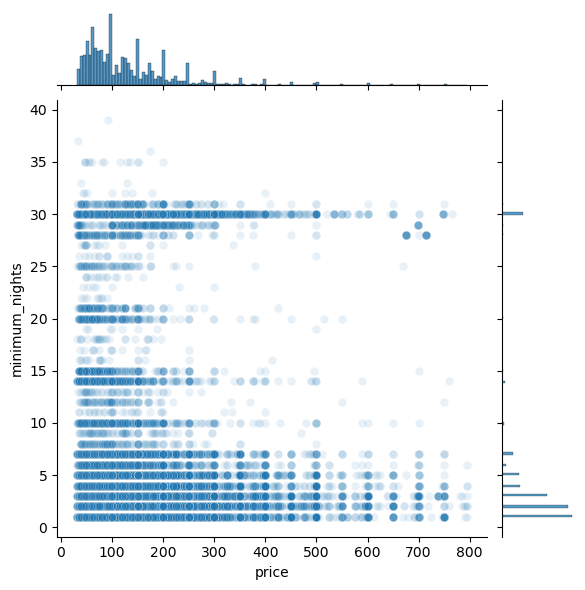

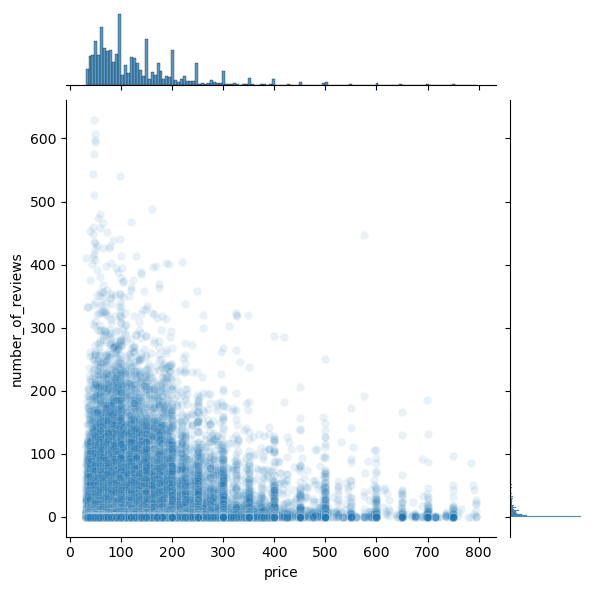

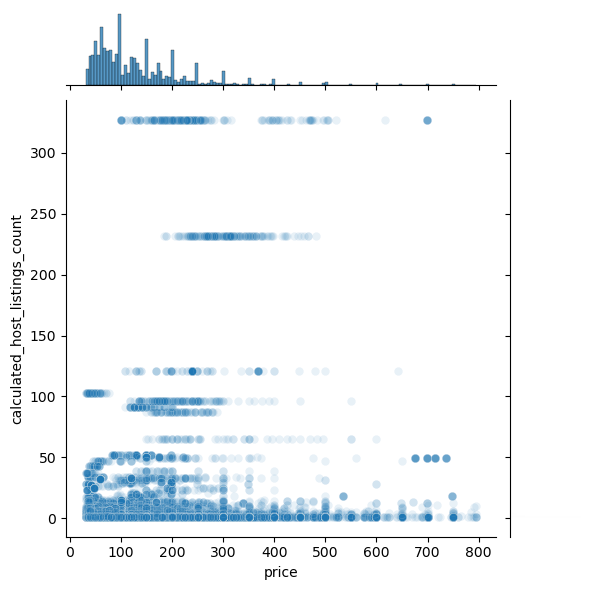

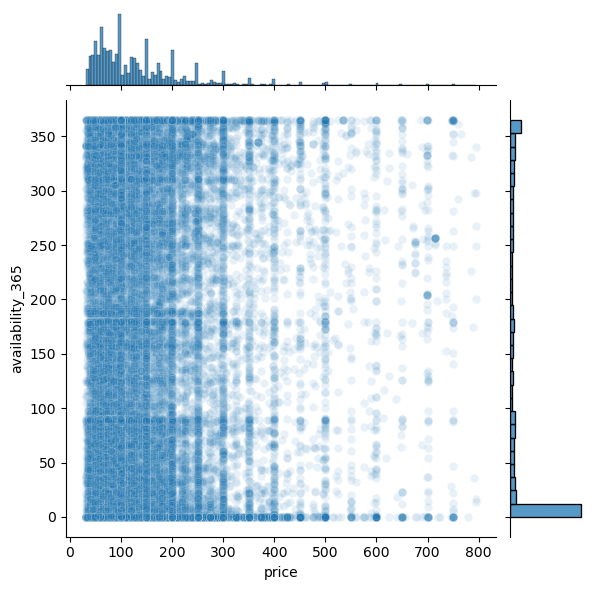

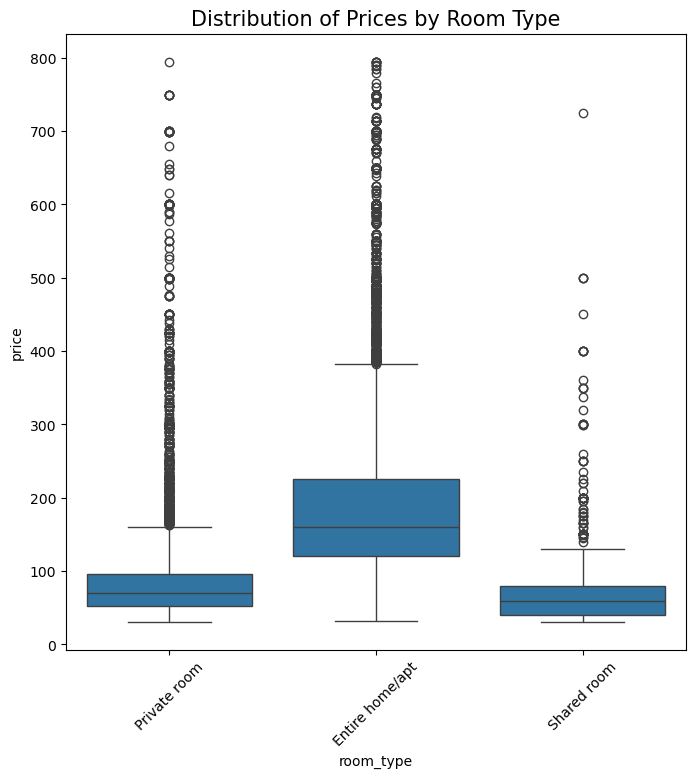

In [314]:
plt.figure(figsize=(8, 8))
sns.boxplot(data=data, x='room_type', y='price')

# Increase the number of ticks (data points) on the x-axis
plt.xticks(rotation=45)  # Rotates x-axis labels for better visibility

plt.title('Distribution of Prices by Room Type', fontsize=15)

# Show the plot
plt.show()

In [315]:
# Analyzing the distribution of room types
data['room_type'].value_counts()


room_type
Entire home/apt    24666
Private room       21703
Shared room          893
Name: count, dtype: int64

In [316]:
# Calculating the average price per room type
rt_price = data.groupby("room_type")["price"].mean()

In [317]:
# Displaying the average prices per room type
rt_price

room_type
Entire home/apt    189.397267
Private room        84.160300
Shared room         74.749160
Name: price, dtype: float64

<div style="background-color:lightblue; padding:10px">
</div>

**Observations:** 

*Median Comparison:*
The central tendency of prices for each room type is below 100 dollars for both private and shared rooms and approx. 190 for entire home/apt.

*Variability:*
For private and shared rooms, there is not much variance lower than the IQR data, and variance till about 150 dollars for private rooms and about 140 dollars for shared rooms. The variability for entre home/apt is much higher: prices spread from about 30 dollars and till about 380 dollars. 

*Outlier Identification:*
The outliers above the upper whisker in a box plot are densely clustered for each room type. There are many outliers in price category: prices are very irregular. We see the subsets of observations that differ significantly from the majority of the data.
These outliers might represent rare but valid occurrences. It could also indicate a potential bias or specific data collection issue where a particular subset of the data is overrepresented, causing dense clusters of extreme values.

<div style="background-color:lightblue; padding:10px">
</div>

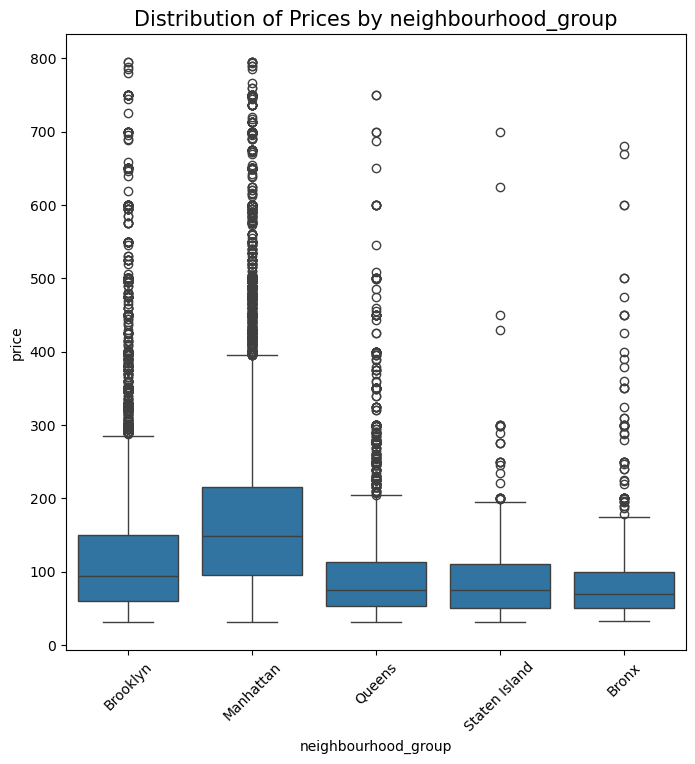

In [318]:
plt.figure(figsize=(8, 8))
sns.boxplot(data=data, x='neighbourhood_group', y='price')

# Increase the number of ticks (data points) on the x-axis
plt.xticks(rotation=45)  # Rotates x-axis labels for better visibility

# Add title
plt.title('Distribution of Prices by neighbourhood_group', fontsize=15)

# Show the plot
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

- **Median Comparison:**
The price medians across Queens, Staten Island and Bronx are very close to each other (approx. 80 dollars, with Bronx a little bit cheaper).

The central tendency for Brooklyn is higher (close to 100 dollars), Manhatten is the most expensive (around 150 dollars as central tendency).

- **Variability:**
The variability of prices is still high for each neighbourhood type, with Brooklin till about 290 dollars, Manhattan till about 400 dollars, Queens till about 210 dollars, Staten Island til about 200 and Bronx till 1bout 190 dollars. 

! Please note, the values are read from the boxplot without identifying precise values for now.

- **Outlier Identification:**
We still have too many outliers (with Staten Island and Bronx as exceptions, which still have higher prices as outliers, but less than other neighbourhood groups). Prices are very irregular. We see the subsets of observations that differ significantly from the majority of the data. 

<div style="background-color:lightblue; padding:10px">
</div>

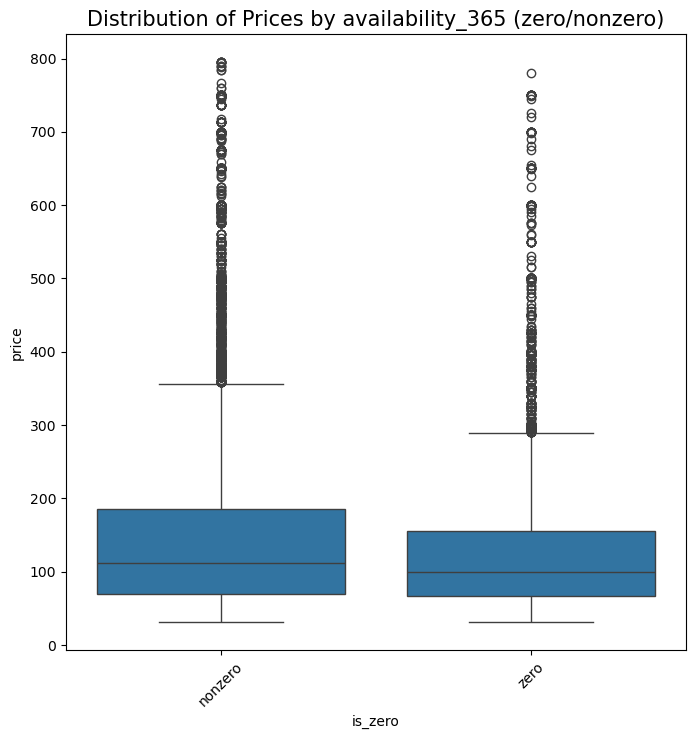

In [319]:
plt.figure(figsize=(8, 8))
sns.boxplot(data=data, x='is_zero', y='price')

# Increase the number of ticks (data points) on the x-axis
plt.xticks(rotation=45)  # Rotates x-axis labels for better visibility

plt.title('Distribution of Prices by availability_365 (zero/nonzero)', fontsize=15)

# Show the plot
plt.show()

### Plot Price based on the Availability 365

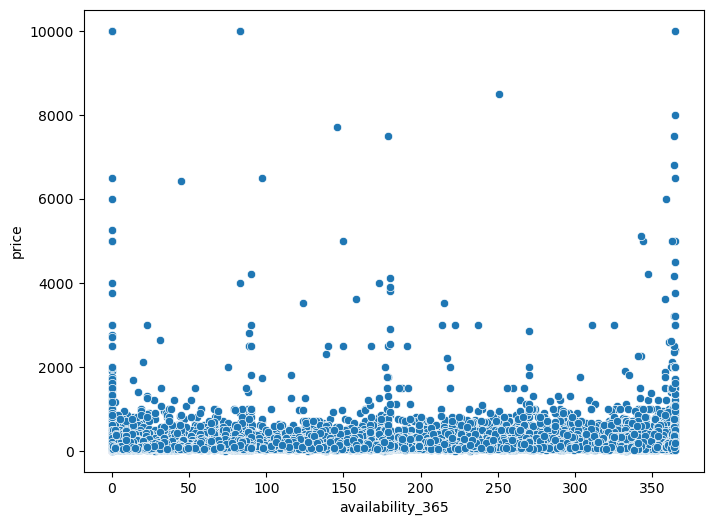

In [401]:
plt.figure(figsize=(8,6))
sns.scatterplot(y=data['price'],x=data['availability_365'])
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

**Observations:**

*Median Comparison:*
The central price tendency is a little bit higher for nonzero availability through the year, but the difference to cetral tendency of rental listings with zero avaiability is quite small.
Though, the interquartile range (IQR), or 50% of data for nonzero spreads till about 190 dollars, with about 150 dollars for zero.

*Variability:* 
The variability of prices is also higher for nonzero availability: it spreads to about 360 dollars for nonzero availability, with about 300 dollars for zero availability.

*Outlier Identification:* We still have too many outliers for both categories.

<div style="background-color:lightblue; padding:10px">
</div>

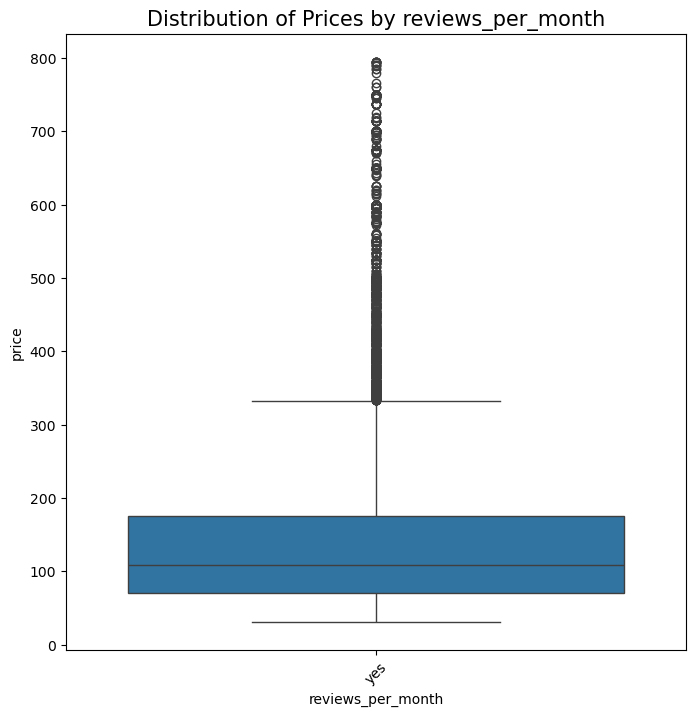

In [320]:
plt.figure(figsize=(8, 8))
sns.boxplot(data=data, x='reviews_per_month', y='price')

# Increase the number of ticks (data points) on the x-axis
plt.xticks(rotation=45)  # Rotates x-axis labels for better visibility

plt.title('Distribution of Prices by reviews_per_month', fontsize=15)

# Show the plot
plt.show()


<div style="background-color:lightblue; padding:10px">
</div>

We remember that after filtering out data with extreme short minimum nights, we got rid of zero values for reviews per month.

<div style="background-color:lightblue; padding:10px">
</div>

In [321]:
# check null values in dataframe
data.isnull().sum()

id                                   0
name                                15
host_id                              0
host_name                           20
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       9465
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
price_log                            0
is_zero                              0
dtype: int64

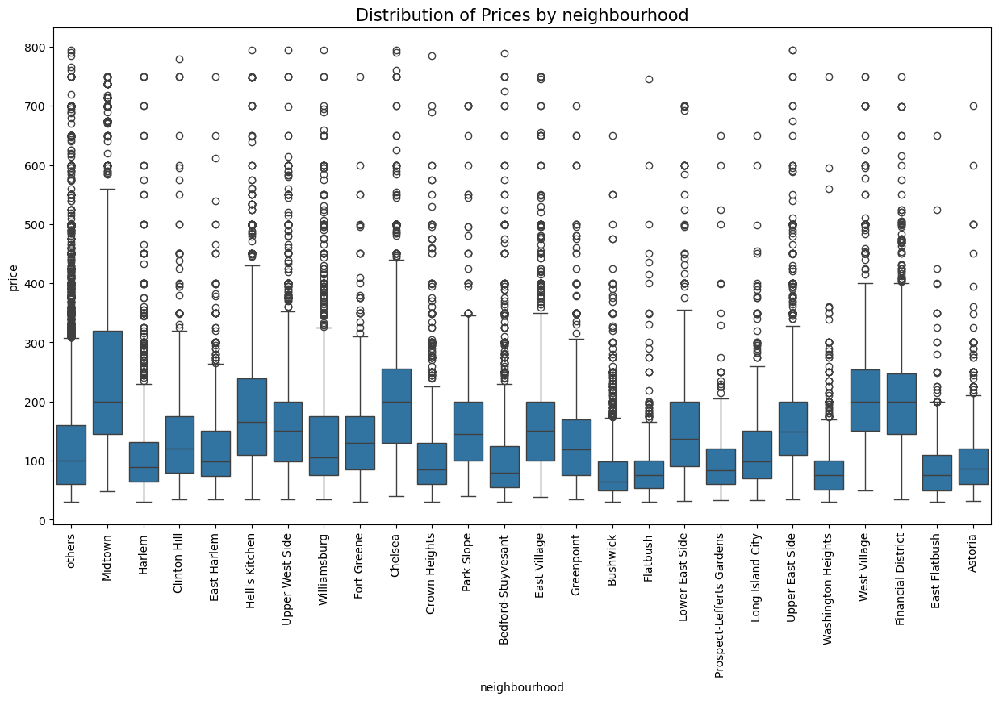

In [322]:
fig = plt.figure(figsize=(15, 8))

sns.boxplot(data=data, x='neighbourhood', y='price')

plt.title('Distribution of Prices by neighbourhood', fontsize=15)

plt.xticks(rotation=90)
plt.show()

<div style="background-color:lightblue; padding:10px">
</div>

**Observations:**

*Median Comparison:*
The central price tendency is the highest for Midtown, Chelsea, West Village and Financial District; the lowest for Bushwick.

*Variability:* 
In Midtown, 50% of data prices spread much higher than in other neighbourhoods. 
Though, the variance of prices is still very high for all districts.

*Outlier Identification:* We still have too many outliers for both categories, with several exceptions (e.g., Fort Greene, Park Slope, GreenpointProspect-Lefferts Gardens, East Flatbush), which still have outlying data, but not so much, as in other neighbourhoods. This may tell about special price policies in these neighbourhoods (e.g., consistent property types) or less bias in data.


<div style="background-color:lightblue; padding:10px">
</div>

In [323]:
# Check data after cleansing:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,price_log
count,4.726200e+04,4.726200e+04,47262.000000,47262.000000,47262.000000,47262.000000,47262.000000,47262.000000,47262.000000,47262.000000
mean,1.898903e+07,6.741744e+07,40.729046,-73.952161,138.905569,5.701092,23.652363,7.222906,111.431213,4.732379
std,1.097612e+07,7.856326e+07,0.054327,0.045993,103.036567,8.370681,44.951930,33.334276,130.905085,0.628833
min,2.539000e+03,2.571000e+03,40.499790,-74.244420,31.000000,1.000000,0.000000,1.000000,0.000000,3.465736
25%,9.444014e+06,7.809862e+06,40.690222,-73.982910,70.000000,1.000000,1.000000,1.000000,0.000000,4.262680
50%,1.963905e+07,3.061305e+07,40.722985,-73.955660,108.000000,2.000000,5.000000,1.000000,43.000000,4.691348
75%,2.910305e+07,1.074344e+08,40.763220,-73.936540,175.000000,5.000000,24.000000,2.000000,222.000000,5.170484
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,795.000000,39.000000,629.000000,327.000000,365.000000,6.679599


In [324]:
# Check if the original data had an index column
has_index_column = data.index.name is not None

data.to_csv('AB_NYC_2019_cleansed.csv', index=has_index_column)


# Conclusions

<div style="background-color:lightblue; padding:10px">
</div>

**General Observations:**

- Dataset Summary: The dataset consists of 48,895 Airbnb listings across 16 columns, including various numeric and categorical features.

- Data Distribution: The highest number of rental listings are in Manhattan, followed by Brooklyn. The number of listings in Staten Island and Bronx is very low. This shows either the market situraion, or biased data. There is a very small amount of shared rooms in the dataset, which may again show the market situration or bias in data.

- Most of the hosts have 6 rental listings on Arbnb.

- Price Distribution: Before cleansing the extreme values, the mean price is 152.73 dollars, with a wide range from 0 to 10,000 dollars.
Log transformation reveals a normal distribution of prices. After cleansing the mean price is 138.9 dollars, with a wide range from 31 to 795 dollars.

- Room Type vs. Price: Shared rooms are consistently cheaper, while private rooms and entire home/apt tend to have higher prices, with a wide range of variability.
  
- Neighborhood vs. Price: Manhattan and Brooklyn tend to have higher-priced listings, while Queens, Staten Island, and Bronx offer a lot of lower-priced rooms.
  
- Correlation Analysis: The dataset shows weak correlations between 'price' and other categories.
  
- Price & Availability: Higher-priced listings tend to have higher availability, whereas lower-priced listings exhibit varied availability patterns.

**Room Type & Neighborhood Insights:**

- Room Type Median Comparison: Private and shared rooms have a central tendency below 100 dollars, while entire home/apt tends to be around $170.
  
- Neighborhood Median Comparison: Manhattan has the highest median price, while Bronx, Queens, and Staten Island have lower medians around $80.
  
- Outliers Identification: Various neighborhoods have outliers with irregular and higher prices, indicating potential bias, inconsistent markt situation or specific property types available (e.g., the quality of the property, which is not available as a category).

- We see clear geographical clusters in data: neighbourood groups and latitude+longtitude correlate with neighbourood groups, so we may want to potencially exclude latitude and longtitude from the feature set later.

The rental types are distributed consistently with an exception for Manhattan: it offers more Entire home/apt than other groups. 

**Features & Availability:**

- Availability Insights: The dataset includes a significant number of listings with very limited availability. 
There highest availability_365 show the rental listings from Bronx and Staten Island, the lowest - Brooklyn and Manhattan.
  
- Availability & Price: Lower-priced listings exhibit diverse availability patterns, while certain price ranges (e.g., 200-300 dollars) depict distinct availability scenarios.

**Data Cleansing & Transformation:**
- Filtering & Transformations: Filtering extreme minimum nights eliminated null values in reviews_per_month, hinting at tendencies not to leave reviews for very short rentals.
  
- Neighborhood Simplification: Grouping less frequent neighborhoods into 'others' can help to generalize the data for analysis.

**Wordclouds**
- The cheapest Airbnbs use words like 'Subway', 'Studio', 'Room', 'Beautiful', 'Cozy', 'Spacious', 'Shared' and 'Cheap' while the expensive Airbnbs use words like 'Penthouse', 'Luxury', 'Location', 'Hidden', 'Park', 'SOHO' and 'View'.

People who choose cheap Airbnbs generally look for properties which are spacious, cosy ambiance, cheap and near to the subway station as it reduces the transport cost and brings down the overall cost of their trip while people who prefer luxurious Airbnbs opt them because of privacy (peaceful and secluded from crowded places), exceptional comfort and a prime location (close to famous landmarks such as 'Central Park').

**Further Considerations:**
- Outlier Presence: The dataset contains various outliers across different features and neighborhoods, potentially impacting analysis outcomes.
  
- High Variability: Prices showcase high variability across neighborhoods, suggesting diverse property types or specific pricing policies.


These observations highlight the complex dynamics within the Airbnb dataset, showcasing different neighborhood influences, pricing policies, and availability patterns. However, the presence of outliers, high variability, and weak correlations between certain features suggest the need for more in-depth analysis or considerations for modeling purposes.

<div style="background-color:lightblue; padding:10px">
</div>
